In [ ]:
# Proyecto final Modelos Computacionales
# Anel Mendiola

In [133]:
import bct
import scipy.io
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import networkx as nx
import pandas as pd
import networkx.algorithms.community as nx_comm
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import cm

In [134]:
archivo = r"C:\Users\ANEL\OneDrive\Escritorio\BCT\2019_03_03_BCT\data_and_demos\Coactivation_matrix.mat"

In [135]:
mat_json = scipy.io.loadmat(archivo)

In [136]:
mat_dict = {k:v for k, v in mat_json.items() if k[0] != '_'}
mat_dict = {k:v for k, v in mat_json.items() if k[0] != '_'}
mat_dict

{'Coactivation_matrix': array([[0.        , 0.16071429, 0.11148649, ..., 0.        , 0.05045872,
         0.1011236 ],
        [0.16071429, 0.        , 0.06825939, ..., 0.        , 0.        ,
         0.06923077],
        [0.11148649, 0.06825939, 0.        , ..., 0.03412969, 0.        ,
         0.        ],
        ...,
        [0.        , 0.        , 0.03412969, ..., 0.        , 0.        ,
         0.        ],
        [0.05045872, 0.        , 0.        , ..., 0.        , 0.        ,
         0.09777778],
        [0.1011236 , 0.06923077, 0.        , ..., 0.        , 0.09777778,
         0.        ]]),
 'Coord': array([[ 7.24363636, 37.01090909,  9.42545455],
        [ 7.98653199, 46.22222222, 15.60942761],
        [ 7.55725191, 33.83206107, 23.51145038],
        ...,
        [-4.92385787, 15.31979695, 27.73604061],
        [-6.27312775, 34.70484581, -5.09251101],
        [-4.53874539, 46.53874539,  3.06273063]])}

In [137]:
mat_dict.keys()

dict_keys(['Coactivation_matrix', 'Coord'])

In [138]:
# buscamos las dimensiones de la matriz
coactmat= mat_json['Coactivation_matrix']
coordenadas = mat_json['Coord']

coactmat_shape = coactmat.shape
coord_shape= coordenadas.shape

coactmat_shape, coord_shape

((638, 638), (638, 3))

In [10]:
# 1. 
# Definir grafos con la matriz estableciendo umbrales de coactivación de 0.8, 0.9 y 1 y graficar cada grafo. 
# Añadir las coordenadas tridimensionales (incluidas en el archivo.mat).

Grafo con umbral 0.08: 638 nodos y 2322 aristas.


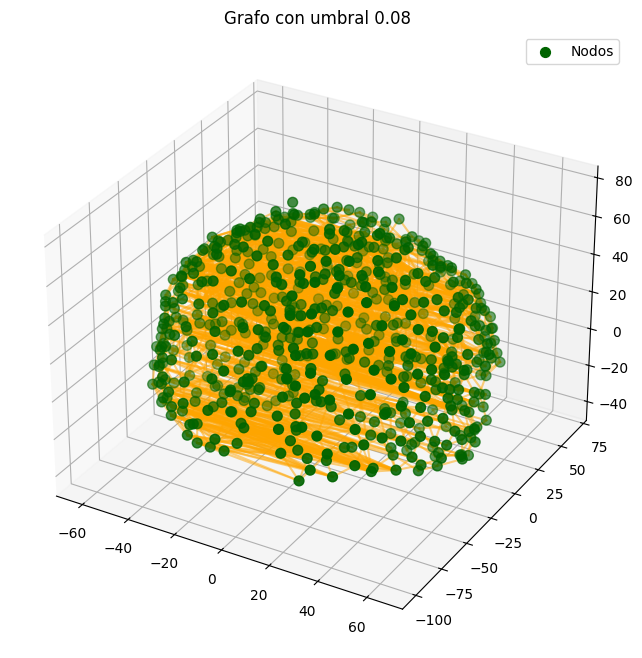

Grafo con umbral 0.09: 638 nodos y 1791 aristas.


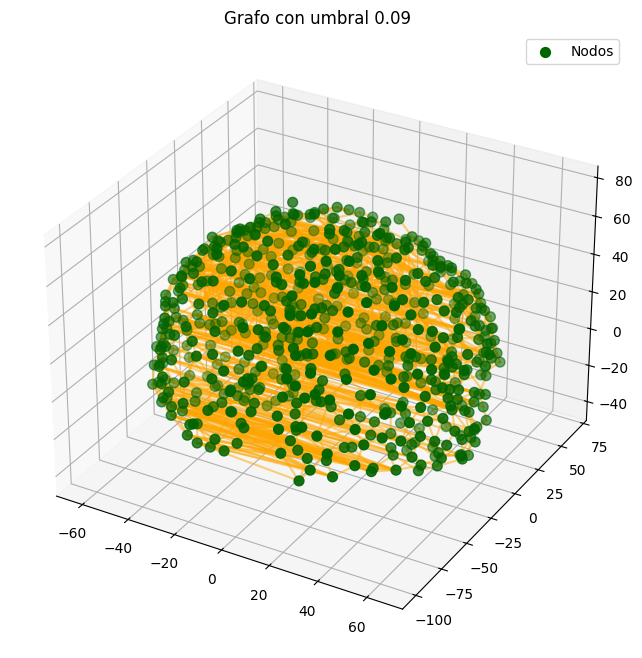

Grafo con umbral 0.1: 638 nodos y 1445 aristas.


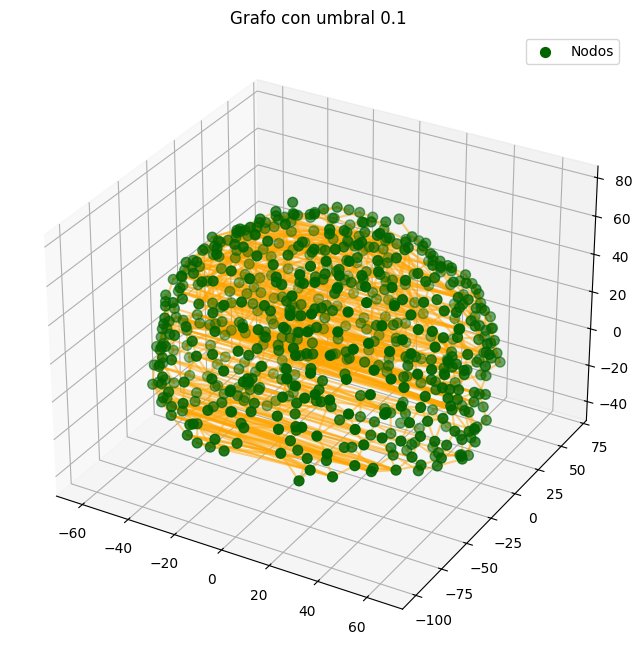

In [141]:
# Crear la función para generar grafos
def generate_graph(mat, umbral, coordenadas):
    # Matriz de adyacencia binaria
    matadj = (mat >= umbral).astype(int)
    np.fill_diagonal(matadj, 0)

    # Crear el grafo
    G = nx.from_numpy_array(matadj)
    
    # Añadir coordenadas 3D a los nodos
    for i, coord in enumerate(coordenadas):
        G.nodes[i]['pos'] = coord

    return G

# Generar los grafos con los umbrales 0.08, 0.09 y 0.10
# si le pongo el umbral de 0.8, 0.9 y 1, no se ven diferentes jejejeje, los puse más bajos

umbrales = [0.08, 0.09, 0.10]
graphs = {umbral: generate_graph(coactmat, umbral, coordenadas) for umbral in umbrales}

# Función para graficar un grafo en 3D
def plot_graph_3d(G, title):
    fig = plt.figure(figsize=(10, 8))
    ax = fig.add_subplot(111, projection='3d')
    
    # Obtener posiciones
    pos = nx.get_node_attributes(G, 'pos')
    if not pos:
        print("Error: Las posiciones 3D no están definidas en los nodos del grafo.")
        return
    
    x, y, z = np.array(list(pos.values())).T

    # Graficar nodos
    ax.scatter(x, y, z, c='darkgreen', s=50, label='Nodos')

    # Graficar aristas
    for edge in G.edges():
        x_edge, y_edge, z_edge = zip(pos[edge[0]], pos[edge[1]])
        ax.plot(x_edge, y_edge, z_edge, c='orange', alpha=0.5)

    ax.set_title(title)
    plt.legend()
    plt.show()

# Graficar los grafos generados
for umbral, graph in graphs.items():
    print(f"Grafo con umbral {umbral}: {graph.number_of_nodes()} nodos y {graph.number_of_edges()} aristas.")
    plot_graph_3d(graph, f"Grafo con umbral {umbral}")
    
# NO SE OBSERVA DIFERENCIAS EN LOS PLOTS

In [12]:
# 2.
# Con uno de los grafos en el punto uno con umbral 0.09, generar una animación donde
# se haga girar 360° el grafo del cerebro para visualizar las conexiones establecidas

In [147]:
from matplotlib.animation import FuncAnimation

def animacion_grafo(G, ej2):
    fig = plt.figure()
    ax= fig.add_subplot(111, projection ='3d')
    pos= nx.get_node_attributes(G, 'pos')
    x, y, z= np.array(list(pos.values())).T
    
    #nodos y aristas
    scatter= ax.scatter(x,y,z, c='darksalmon', s=20, label='Nodos')
    lines = []
    for edge in G.edges():
        x_edge, y_edge, z_edge = zip(pos[edge[0]],pos[edge[1]])
        lines.append(ax.plot( x_edge, y_edge, z_edge, c= 'lightseagreen', alpha= 0.5)[0])
        
    ax.set_title("Grafo con umbral 0.09")
    
    # rotación
    def update(frame):
        ax.view_init(elev=10, azim=frame)
        return scatter, *lines
        
    # animación    
    ani = FuncAnimation(fig, update, frames= np.arange(0, 360, 2), interval= 50, blit= False)
    
    #guardamos la animación como gif para que rote todo el tiempo

    ani.save(ej2, writer='pillow', fps=20)
    plt.close(fig)
    # en otros ejercicios usé otra animación, pero no sale rotando todo el tiempo
    # con un gif se ve más bonito

ruta_archivo = r"C:\Users\ANEL\grafo1.gif"
grafo09= graphs[0.09]
animacion_grafo(grafo09, ruta_archivo)

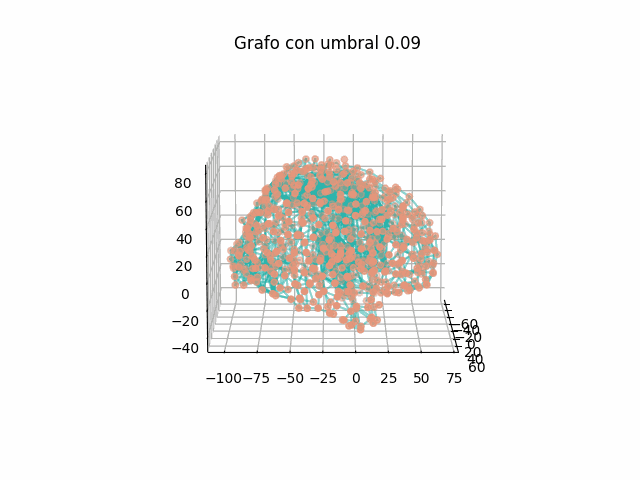

In [148]:
# a ver si salió la animación :o
from IPython.display import Image
Image(r"C:\Users\ANEL\grafo1.gif") 

In [15]:
#3.
#  Encontrar los hubs del grafo, y establecer el tamaño del nodo proporcional al valor del grado

Grados de los nodos: {0: 5, 1: 5, 2: 4, 3: 3, 4: 3, 5: 3, 6: 4, 7: 8, 8: 3, 9: 3, 10: 2, 11: 3, 12: 3, 13: 1, 14: 1, 15: 4, 16: 5, 17: 3, 18: 4, 19: 8, 20: 3, 21: 3, 22: 4, 23: 3, 24: 4, 25: 3, 26: 2, 27: 4, 28: 4, 29: 4, 30: 3, 31: 5, 32: 4, 33: 3, 34: 4, 35: 5, 36: 4, 37: 6, 38: 16, 39: 3, 40: 5, 41: 6, 42: 5, 43: 3, 44: 6, 45: 4, 46: 3, 47: 2, 48: 4, 49: 4, 50: 4, 51: 3, 52: 2, 53: 3, 54: 5, 55: 4, 56: 2, 57: 5, 58: 2, 59: 4, 60: 2, 61: 3, 62: 5, 63: 5, 64: 6, 65: 6, 66: 4, 67: 5, 68: 5, 69: 7, 70: 10, 71: 4, 72: 4, 73: 5, 74: 4, 75: 3, 76: 4, 77: 4, 78: 3, 79: 2, 80: 4, 81: 6, 82: 3, 83: 4, 84: 5, 85: 3, 86: 5, 87: 5, 88: 3, 89: 3, 90: 2, 91: 3, 92: 3, 93: 5, 94: 2, 95: 3, 96: 3, 97: 4, 98: 5, 99: 4, 100: 9, 101: 3, 102: 3, 103: 3, 104: 5, 105: 3, 106: 4, 107: 3, 108: 4, 109: 3, 110: 5, 111: 3, 112: 4, 113: 5, 114: 2, 115: 3, 116: 4, 117: 3, 118: 4, 119: 3, 120: 5, 121: 8, 122: 5, 123: 3, 124: 4, 125: 5, 126: 7, 127: 3, 128: 5, 129: 2, 130: 6, 131: 6, 132: 4, 133: 3, 134: 5, 135: 9

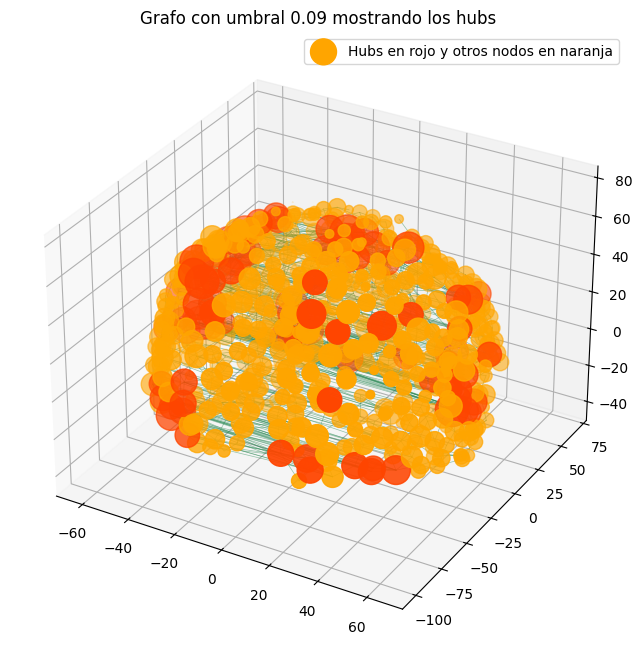

In [155]:
def plot_hubs(G, ej3a):
    # Obtener posiciones 3D de los nodos
    pos = nx.get_node_attributes(G, 'pos')
    x, y, z = np.array(list(pos.values())).T

    # Calcular el grado de los nodos
    grados = dict(G.degree())
    print("Grados de los nodos:", grados)

    # Escalar el tamaño de los nodos proporcional al grado
    tam_min, tam_max = 0.01, 700
    grad_max = max(grados.values())
    # MUY BIEN
    tamnod = [
        tam_min + (grado / grad_max) * (tam_max - tam_min) for grado in grados.values()
    ]

    # Identificar hubs
    # XQ THRESHOLD = 90?
    # hub = grado arriba de media +una desviación estandar
    umbral = np.percentile(list(grados.values()), 90)
    hub_nodes = [node for node, grado in grados.items() if grado >= umbral]
    print(f"Nodos hubs (grado ≥ {umbral}): {hub_nodes}")

    # Colorear los hubs de rojo y los demás nodos de naranja
    nodcol = ['orangered' if node in hub_nodes else 'orange' for node in G.nodes()]

    # Crear figura 3D
    fig = plt.figure(figsize=(12, 8))
    ax = fig.add_subplot(111, projection='3d')

    # Graficar nodos
    scatter = ax.scatter(x, y, z, c=nodcol, s=tamnod, label='Nodos')

    # Graficar aristas
    for edge in G.edges():
        x_edge, y_edge, z_edge = zip(pos[edge[0]], pos[edge[1]])
        ax.plot(x_edge, y_edge, z_edge, c='seagreen', alpha=0.5, linewidth=0.5)

    # Ajustar título y leyenda
    ax.set_title(ej3a)
    ax.legend(["Hubs en rojo y otros nodos en naranja"])
    plt.show()

# Grafo con umbral de 0.09
grafo09 = generate_graph(coactmat, 0.09, coordenadas)
plot_hubs(grafo01, "Grafo con umbral 0.09 mostrando los hubs")

In [ ]:
#4.
#En función de la matriz de emparejamiento (correlación de la matriz de adyacencia), 
# establecer una partición de los nodos en módulos. Escoger el número de módulos que creas conveniente y justificar por qué escogiste ese número.

In [164]:
import community as community_louvain
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import networkx as nx

Ya se calculó la matriz de adyacencia
Ya se calculó la matriz de emparejamiento


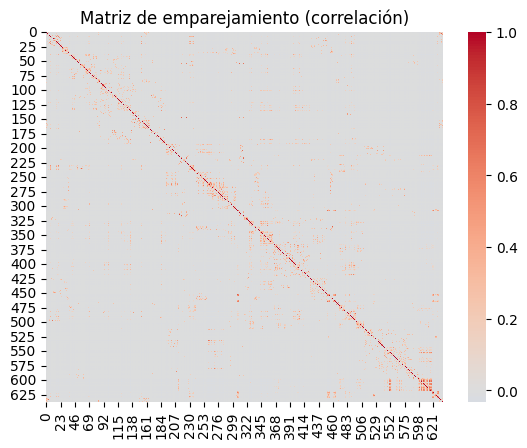

Calculando la partición de los nodos en módulos
Ya quedó la partición: {0: 0, 1: 0, 2: 0, 3: 0, 4: 0, 5: 1, 6: 1, 7: 2, 8: 1, 9: 3, 10: 1, 11: 3, 12: 1, 13: 3, 14: 3, 15: 1, 16: 2, 17: 1, 18: 1, 19: 2, 20: 1, 21: 3, 22: 3, 23: 3, 24: 3, 25: 3, 26: 3, 27: 3, 28: 3, 29: 3, 30: 3, 31: 3, 32: 3, 33: 3, 34: 3, 35: 4, 36: 3, 37: 2, 38: 2, 39: 2, 40: 2, 41: 2, 42: 2, 43: 2, 44: 2, 45: 2, 46: 5, 47: 6, 48: 6, 49: 6, 50: 2, 51: 6, 52: 7, 53: 6, 54: 7, 55: 9, 56: 2, 57: 2, 58: 2, 59: 9, 60: 9, 61: 9, 62: 2, 63: 2, 64: 2, 65: 2, 66: 6, 67: 2, 68: 2, 69: 2, 70: 2, 71: 6, 72: 9, 73: 2, 74: 9, 75: 9, 76: 2, 77: 9, 78: 9, 79: 9, 80: 2, 81: 0, 82: 0, 83: 0, 84: 0, 85: 0, 86: 0, 87: 6, 88: 10, 89: 2, 90: 10, 91: 6, 92: 10, 93: 2, 94: 2, 95: 10, 96: 10, 97: 2, 98: 6, 99: 10, 100: 2, 101: 10, 102: 10, 103: 6, 104: 6, 105: 10, 106: 6, 107: 6, 108: 6, 109: 6, 110: 6, 111: 6, 112: 6, 113: 6, 114: 10, 115: 6, 116: 2, 117: 10, 118: 2, 119: 6, 120: 6, 121: 2, 122: 6, 123: 10, 124: 2, 125: 2, 126: 2, 127: 6, 12

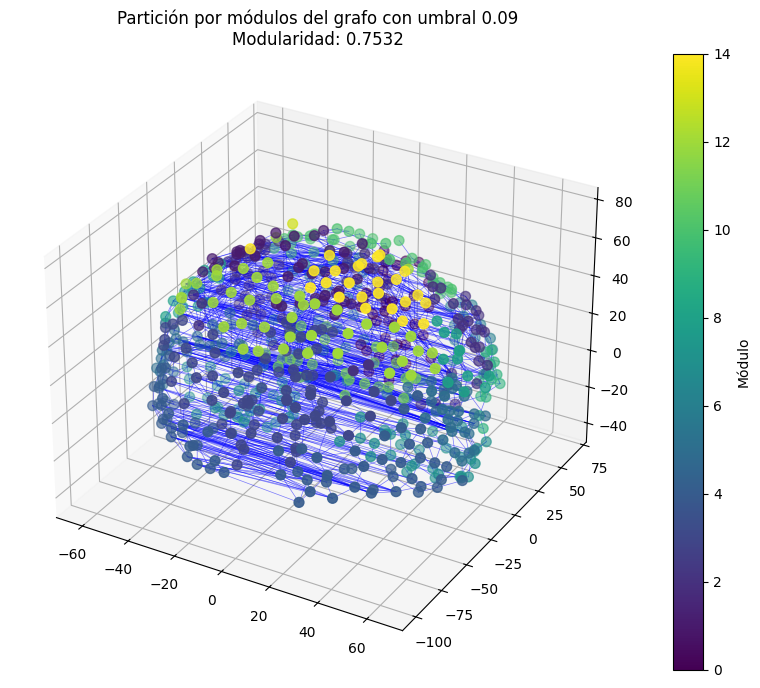

In [169]:
def robust_corrcoef(mat):
    
    std_dev = np.std(mat, axis=1)
    # XQ ES NECESARIO?
    valid_rows = std_dev > 0  # aquí se filtran las filas que no son constantes
    if np.sum(valid_rows) == 0:
        raise ValueError("Todas las filas tienen desviación estándar cero.")
    filtered_mat = mat[valid_rows][:, valid_rows]
    return np.corrcoef(filtered_mat)

def modulos(G, ej4):
    
    # Sacamos la matriz de adyacencia
    matadj = nx.to_numpy_array(G)
    print("Ya se calculó la matriz de adyacencia")

    # Calcular la matriz de emparejamiento
    try:
        corrmat = robust_corrcoef(matadj)
    except ValueError as e:
        print(e)
        return  # Salir si no hay filas válidas
    
    print("Ya se calculó la matriz de emparejamiento")

    # Visualizar la matriz de emparejamiento
    sns.heatmap(corrmat, cmap="coolwarm", center=0)
    plt.title("Matriz de emparejamiento (correlación)")
    plt.show()

    # Partición por módulos usando el algoritmo de Louvain
    print("Calculando la partición de los nodos en módulos")
    particion = community_louvain.best_partition(G)
    print("Ya quedó la partición:", particion)

    # Colorear nodos según su módulo
    nodcol = list(particion.values())

    # Cálculo de la modularidad
    modularidad = community_louvain.modularity(particion, G)
    print(f"Modularidad calculada: {modularidad:.4f}")

    # Figura en 3D
    fig = plt.figure(figsize=(12, 8))
    ax = fig.add_subplot(111, projection='3d')

    # Obtener posiciones de los nodos
    pos = nx.get_node_attributes(G, 'pos')
    if not pos:
        raise ValueError("El grafo no tiene posiciones 3D asignadas a los nodos.")

    x, y, z = np.array(list(pos.values())).T

    # Graficar los nodos
    scatter = ax.scatter(x, y, z, c=nodcol, cmap="viridis", s=50, label='Nodos')

    # Graficar las aristas
    for edge in G.edges():
        x_edge, y_edge, z_edge = zip(pos[edge[0]], pos[edge[1]])
        ax.plot(x_edge, y_edge, z_edge, c='b', alpha=0.5, linewidth=0.5)

    # Título y leyenda
    ax.set_title(f"{ej4}\nModularidad: {modularidad:.4f}")
    plt.colorbar(scatter, ax=ax, label="Módulo")
    plt.show()

# Grafo con umbral 0.1
grafo09 = generate_graph(coactmat, 0.09, coordenadas)

# Partición por módulos y graficar
modulos(grafo09, "Partición por módulos del grafo con umbral 0.09")

In [ ]:
# Justificación
# Tuve que usar un umbral de 0.1 para que saliera la modularidad, en este caso
# utilicé el algoritmo de Louvain para maximizar la modularidad al agrupar los nodos
# más conectados dentro de varias comunidades y minimizando las conexiones entre comunidades.
# los nodos se organizan de manera cohesiva, en el cerebro esta modularidad refleja áreas
# funcionales especializadas que colaboran dentro de cada mósulo, se comunican con otras áreas 
# usando otras conexiones más reducidas pero específicas. 
# se observan de diferentes colores los diferentes módulos

In [20]:
# 5. 5) Determinar el conjunto del Rich Club y discutir las implicaciones anatómicas y
# funcionales de este grupo de nodos (mínimo 100 palabras).

Nodos del Rich Club con grado ≥ 10): [19, 38, 69, 70, 100, 121, 135, 186, 202, 213, 230, 235, 237, 253, 261, 262, 266, 267, 271, 279, 285, 308, 309, 327, 328, 330, 331, 334, 344, 345, 346, 350, 352, 353, 356, 361, 362, 373, 393, 397, 400, 403, 407, 410, 416, 418, 452, 453, 454, 457, 465, 473, 477, 481, 482, 485, 488, 491, 494, 496, 500, 532, 552, 553, 599, 601, 603, 606, 607, 611, 612, 613, 615, 616, 617, 618, 619, 621, 622, 629]


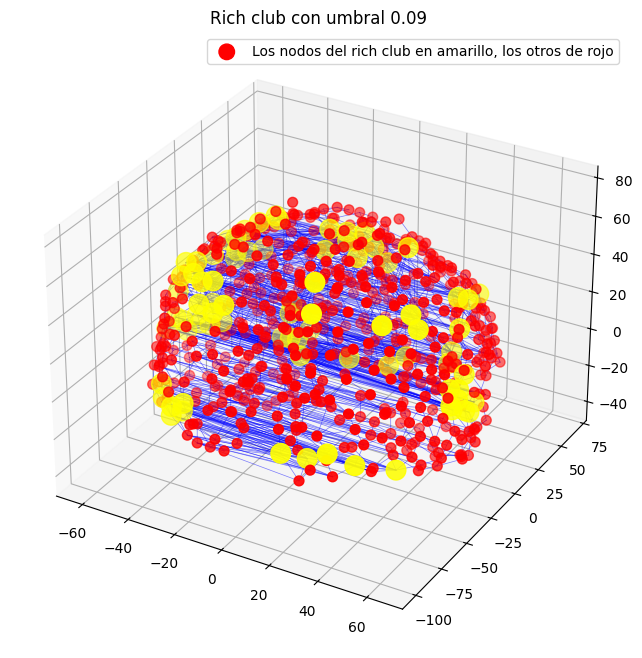

In [156]:
def rich_club(G, ej5, min_degree=10):
    
    # grados de los nodos
    grados= dict(G.degree())
    
    #seleccionamos los nodos con grado >= min_degree
    rc_nodes= [node for node, degree in grados.items() if degree >= min_degree]
    print(f"Nodos del Rich Club con grado ≥ {min_degree}): {rc_nodes}")

    # verificar los nodos del rich club
    if not rc_nodes:
        print("No  se encontraron nodos con grado mayor o igual a ", min_degree)

    # posiciones de los nodos
    pos= nx.get_node_attributes(G, 'pos')
    x,y,z = np.array(list(pos.values())).T

    # colores y tamaños
    node_color = ['yellow' if node in rc_nodes else 'red' for node in G.nodes()]
    node_sizes = [200 if node in rc_nodes else 50 for node in G.nodes()]

    # crear figura en 3d
    fig= plt.figure(figsize=(12,8))
    ax= fig.add_subplot(111, projection='3d')

    # graficar nodos 
    ax.scatter(x, y, z, c=node_color, s=node_sizes, label='Nodos')

    # Graficar aristas
    for edge in G.edges():
        if edge[0] in pos and edge[1] in pos:
            x_edge, y_edge, z_edge = zip(pos[edge[0]], pos[edge[1]])
            ax.plot(x_edge, y_edge, z_edge, c='b', alpha=0.5, linewidth=0.5)

    # Configurar título
    ax.set_title(ej5)
    plt.legend(["Los nodos del rich club en amarillo, los otros de rojo"])
    plt.show()

# grafo
grafo09= generate_graph(coactmat, 0.09, coordenadas)

rich_club(grafo09, "Rich club con umbral 0.09", min_degree=10)

In [34]:
# Discusión
# El rich Club es la manera de representar muchos nodos altamente conectados, estos son cruciales para la integración global
# de la información que recibe el cerebro. En este caso, los nodos corresponden a regiones de alto grado
# como la corteza prefrontal y áreas de asociación. Anatómicamente hablando, el rich club hace más fácil 
# la comunicación entre los diferentes módulos cerebrales, funcionan como núcleos integradores.
# Funcionalmente hablando, que tengan tanta conectividad es importante para procesos cognitivos complejos,
# como por ejemplo la toma de decisiones, la memoria, la atención, etc. 

In [24]:
# 6.
# Supongamos que eliminamos los nodos del RichClub, describir cómo cambian las
# propiedades topológicas del grafo, hacer comparativas del grado, coeficiente de
# cluster, coeficiente de mundo pequeño y las medidas de centralidad 
# (cercanía,intermediación)

Calculamos las propiedades del grafo original:
{'grado_medio': 4.529780564263323, 'coeficiente_de_agrupamiento': 0.24364464673564803, 'centralidad_cercania': np.float64(0.1194031264903796), 'centralidad_intermediacion': np.float64(0.01147712930871217)}
Nodos del Rich Club (grado ≥ 10): [38, 70, 186, 230, 235, 253, 262, 328, 330, 334, 346, 356, 362, 397, 400, 407, 416, 454, 473, 477, 481, 482, 485, 488, 491, 494, 532, 599, 603, 606, 607, 616, 617, 619, 629]
Calculando las propiedades del grafo sin el Rich Club:
{'grado_medio': 3.691542288557214, 'coeficiente_de_agrupamiento': 0.22183658427439523, 'centralidad_cercania': np.float64(0.09214115900724197), 'centralidad_intermediacion': np.float64(0.016110568269096143)}
Comparando de propiedades:
Grado_medio:
  Original: 4.5298
  Modificado: 3.6915
  Cambio: -18.51%

Coeficiente_de_agrupamiento:
  Original: 0.2436
  Modificado: 0.2218
  Cambio: -8.95%

Centralidad_cercania:
  Original: 0.1194
  Modificado: 0.0921
  Cambio: -22.83%

Centralid

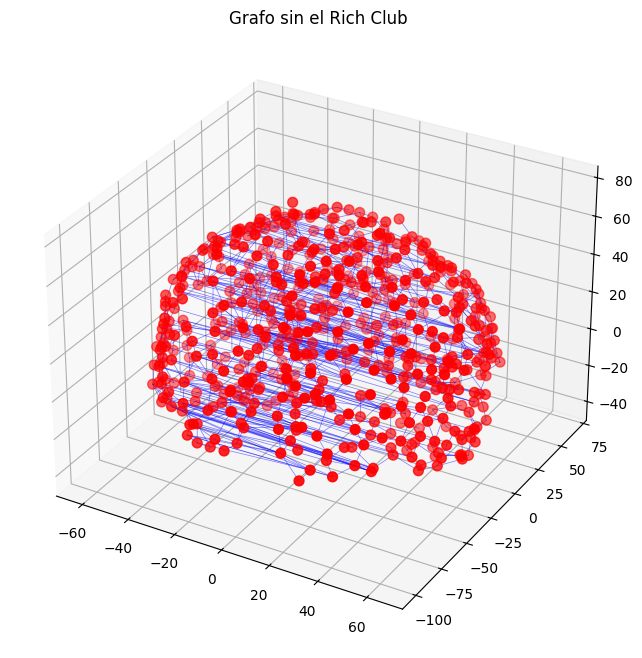

In [157]:
def propiedades_grafo(G):
    propiedades = {}

    # Grado medio
    avg_grad = sum(dict(G.degree()).values()) / G.number_of_nodes()
    propiedades['grado_medio'] = avg_grad

    # Coeficiente de agrupamiento (cluster)
    coef_cluster = nx.average_clustering(G)
    propiedades['coeficiente_de_agrupamiento'] = coef_cluster

    # Centralidad de cercanía (promedio)
    cercania = np.mean(list(nx.closeness_centrality(G).values()))
    propiedades['centralidad_cercania'] = cercania

    # Centralidad de intermediación (promedio)
    betweenness = nx.betweenness_centrality(G)
    intermediacion = np.mean(list(betweenness.values()))
    propiedades['centralidad_intermediacion'] = intermediacion

    return propiedades

def comparacion_propiedades(datos_originales, datos_modificados):

    print("Comparando de propiedades:")
    for prop in datos_originales.keys():
        original = datos_originales[prop]
        modificado = datos_modificados[prop]
        cambio = ((modificado - original) / original) * 100 if original != 0 else "N/A"
        print(f"{prop.capitalize()}:")
        print(f"  Original: {original:.4f}")
        print(f"  Modificado: {modificado:.4f}")
        print(f"  Cambio: {cambio if cambio == 'N/A' else cambio:.2f}%\n")

# Generar el grafo original
grafo_original = generate_graph(coactmat, 0.1, coordenadas)
grados = dict(grafo_original.degree())

# Cálculo de las propiedades iniciales
print("Calculamos las propiedades del grafo original:")
datos_originales = propiedades_grafo(grafo_original)
print(datos_originales)

# Seleccionar nodos del Rich Club
min_degree = 10
rc_nodes = [node for node, degree in grados.items() if degree >= min_degree]
print(f"Nodos del Rich Club (grado ≥ {min_degree}): {rc_nodes}")

# Copiar el grafo y eliminar los nodos del Rich Club
grafo_modificado = grafo_original.copy()
grafo_modificado.remove_nodes_from(rc_nodes)

# Calcular las propiedades del grafo modificado
print("Calculando las propiedades del grafo sin el Rich Club:")
datos_modificados = propiedades_grafo(grafo_modificado)
print(datos_modificados)

# Comparar propiedades
comparacion_propiedades(datos_originales, datos_modificados)

# Visualizar el grafo modificado sin el Rich Club
def plot_grafo(G, titulo):
    pos = nx.get_node_attributes(G, 'pos')
    x, y, z = np.array(list(pos.values())).T

    fig = plt.figure(figsize=(12, 8))
    ax = fig.add_subplot(111, projection='3d')

    # Graficar nodos y aristas
    scatter = ax.scatter(x, y, z, c='red', s=50)
    for edge in G.edges():
        x_edge, y_edge, z_edge = zip(pos[edge[0]], pos[edge[1]])
        ax.plot(x_edge, y_edge, z_edge, c='blue', alpha=0.5, linewidth=0.5)

    ax.set_title(titulo)
    plt.show()

plot_grafo(grafo_modificado, "Grafo sin el Rich Club")

In [ ]:
#7.
# Quitar 10%-50% de los nodos con mayor medida de intermediación y describir
# cómo cambian las propiedades topológicas del grafo, hacer comparativas del grado,
# coeficiente de cluster, coeficiente de mundo pequeño y las medidas de centralidad
# (cercanía, intermediación)

Calculando las propiedades del grafo original: 
{'grado_medio': 5.614420062695925, 'coeficiente_de_agrupamiento': 0.2785052819986504, 'centralidad_cercania': np.float64(0.14410899273204028), 'centralidad_intermediacion': np.float64(0.009627134336679834)}
Eliminando el 10.0% de los nodos con mayor intermediación: [373, 235, 330, 334, 285, 619, 400, 352, 481, 275, 220, 277, 121, 353, 280, 134, 38, 50, 135, 16, 488, 482, 371, 397, 589, 618, 427, 2, 565, 591, 431, 291, 3, 0, 65, 154, 128, 344, 605, 160, 286, 517, 532, 553, 356, 237, 611, 159, 491, 410, 230, 362, 546, 328, 454, 281, 37, 513, 346, 57, 153, 69, 549]
Eliminando el 20.0% de los nodos con mayor intermediación: [373, 235, 330, 334, 285, 619, 400, 352, 481, 275, 220, 277, 121, 353, 280, 134, 38, 50, 135, 16, 488, 482, 371, 397, 589, 618, 427, 2, 565, 591, 431, 291, 3, 0, 65, 154, 128, 344, 605, 160, 286, 517, 532, 553, 356, 237, 611, 159, 491, 410, 230, 362, 546, 328, 454, 281, 37, 513, 346, 57, 153, 69, 549, 590, 593, 485, 195, 4

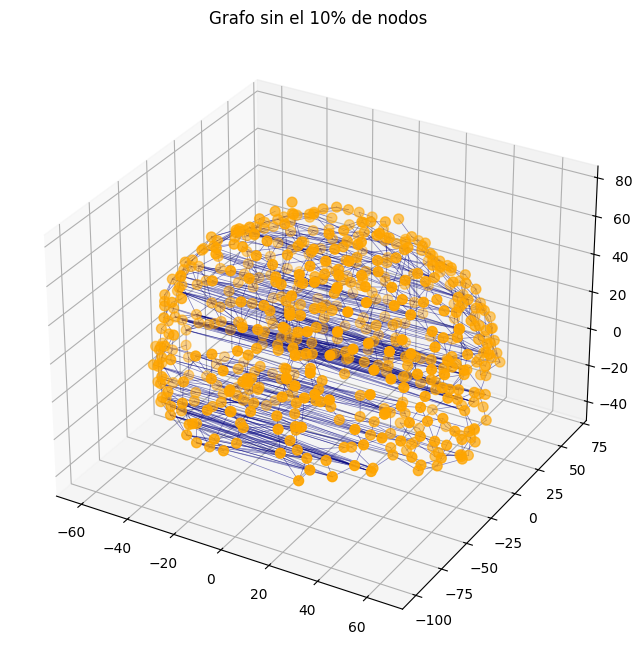

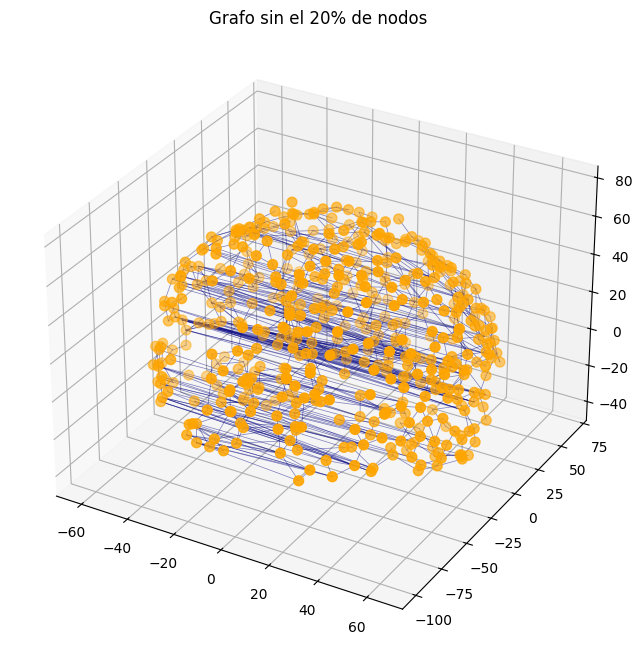

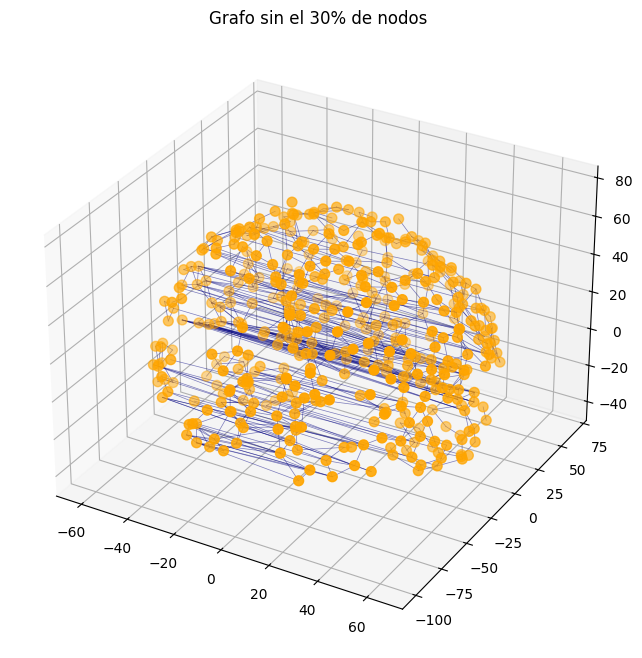

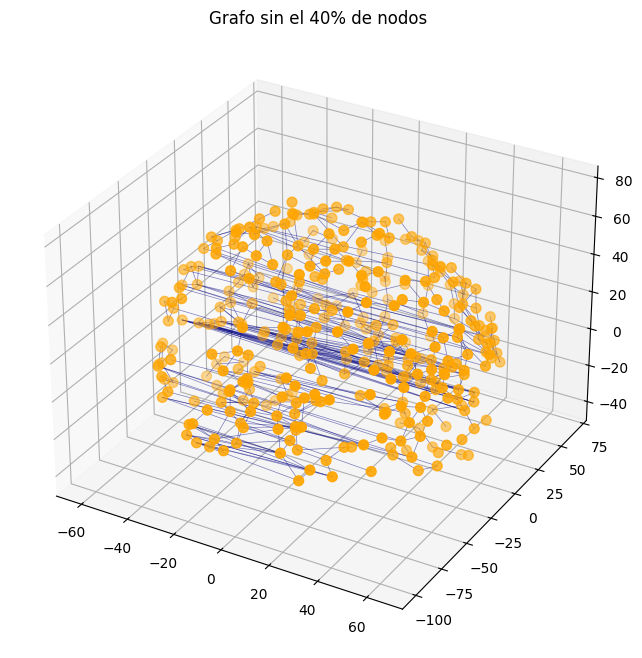

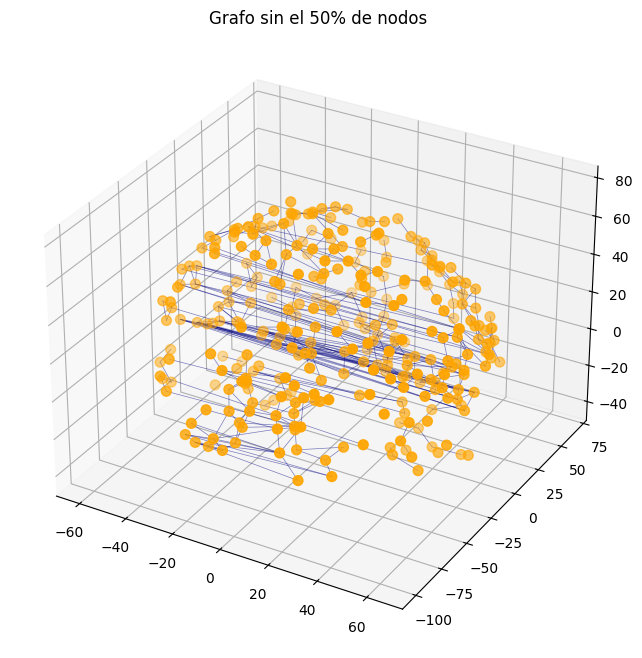

In [159]:
import networkx as nx
import numpy as np
import matplotlib.pyplot as plt

def propiedades_grafo(G):
    propiedades = {}

    # Grado medio
    avg_grad = sum(dict(G.degree()).values()) / G.number_of_nodes()
    propiedades['grado_medio'] = avg_grad

    # Coeficiente de agrupamiento (cluster)
    coef_cluster = nx.average_clustering(G)
    propiedades['coeficiente_de_agrupamiento'] = coef_cluster

    # Centralidad de cercanía (promedio)
    cercania = np.mean(list(nx.closeness_centrality(G).values()))
    propiedades['centralidad_cercania'] = cercania

    # Centralidad de intermediación (promedio)
    betweenness = nx.betweenness_centrality(G)
    intermediacion = np.mean(list(betweenness.values()))
    propiedades['centralidad_intermediacion'] = intermediacion

    return propiedades

def comparacion_propiedades(datos_originales, datos_modificados):

    print("Comparando de propiedades:")
    for prop in datos_originales.keys():
        original = datos_originales[prop]
        modificado = datos_modificados[prop]
        cambio = ((modificado - original) / original) * 100 if original != 0 else "N/A"
        print(f"{prop.capitalize()}:")
        print(f"  Original: {original:.4f}")
        print(f"  Modificado: {modificado:.4f}")
        print(f"  Cambio: {cambio if cambio == 'N/A' else cambio:.2f}%\n")

# Función para eliminar un porcentaje de nodos
def eliminar_porcentaje(G, percentaje=0.1):
    
    # Calcular centralidad de intermediación
    betweenness = nx.betweenness_centrality(G)

    # Ordenar los nodos por centralidad de intermediación de mayor a menor
    sorted_nodes = sorted(betweenness.items(), key=lambda x: x[1], reverse=True)

    # Calcular el número de nodos a eliminar
    num_nodos_eliminar = int(len(sorted_nodes) * percentaje)
    nodos_quitar = [node for node, _ in sorted_nodes[:num_nodos_eliminar]]

    # Crear una copia del grafo y eliminar los nodos
    grafo_modificado = G.copy()
    grafo_modificado.remove_nodes_from(nodos_quitar)

    print(f"Eliminando el {percentaje*100}% de los nodos con mayor intermediación: {nodos_quitar}")
    
    return grafo_modificado

# Grafo original
grafo_original = generate_graph(coactmat, 0.09, coordenadas)

# Calculamos las propiedades del grafo original
print("Calculando las propiedades del grafo original: ")
datos_originales = propiedades_grafo(grafo_original)
print(datos_originales)

# Eliminar diferentes porcentajes de nodos con mayor centralidad
percentajes = [0.1, 0.2, 0.3, 0.4, 0.5]
grafo_modificado1 = eliminar_porcentaje(grafo_original, percentaje=percentajes[0])
grafo_modificado2 = eliminar_porcentaje(grafo_original, percentaje=percentajes[1])
grafo_modificado3 = eliminar_porcentaje(grafo_original, percentaje=percentajes[2])
grafo_modificado4 = eliminar_porcentaje(grafo_original, percentaje=percentajes[3])
grafo_modificado5 = eliminar_porcentaje(grafo_original, percentaje=percentajes[4])

# Calcular las propiedades de los nuevos grafos
print("\nCalculando las propiedades del grafo sin el 10%:")
datos_modificados_10 = propiedades_grafo(grafo_modificado1)
print(datos_modificados_10)

print("\nCalculando las propiedades del grafo sin el 20%:")
datos_modificados_20 = propiedades_grafo(grafo_modificado2)
print(datos_modificados_20)

print("\nCalculando las propiedades del grafo sin el 30%:")
datos_modificados_30 = propiedades_grafo(grafo_modificado3)
print(datos_modificados_30)

print("\nCalculando las propiedades del grafo sin el 40%:")
datos_modificados_40 = propiedades_grafo(grafo_modificado4)
print(datos_modificados_40)

print("\nCalculando las propiedades del grafo sin el 50%:")
datos_modificados_50 = propiedades_grafo(grafo_modificado5)
print(datos_modificados_50)

# Comparar propiedades
comparacion_propiedades(datos_originales, datos_modificados_10)
comparacion_propiedades(datos_originales, datos_modificados_20)
comparacion_propiedades(datos_originales, datos_modificados_30)
comparacion_propiedades(datos_originales, datos_modificados_40)
comparacion_propiedades(datos_originales, datos_modificados_50)

# Visualizar los grafos modificados
def plot_grafo(G, titulo):
    pos = nx.get_node_attributes(G, 'pos')
    x, y, z = np.array(list(pos.values())).T

    fig = plt.figure(figsize=(12, 8))
    ax = fig.add_subplot(111, projection='3d')

    # Graficar nodos y aristas
    scatter = ax.scatter(x, y, z, c='orange', s=50)
    for edge in G.edges():
        x_edge, y_edge, z_edge = zip(pos[edge[0]], pos[edge[1]])
        ax.plot(x_edge, y_edge, z_edge, c='navy', alpha=0.5, linewidth=0.5)

    ax.set_title(titulo)
    plt.show()

# Graficar los grafos
plot_grafo(grafo_modificado1, "Grafo sin el 10% de nodos")
plot_grafo(grafo_modificado2, "Grafo sin el 20% de nodos")
plot_grafo(grafo_modificado3, "Grafo sin el 30% de nodos")
plot_grafo(grafo_modificado4, "Grafo sin el 40% de nodos")
plot_grafo(grafo_modificado5, "Grafo sin el 50% de nodos")

In [ ]:
# 8.
# Generar un modelo nulo aleatorio donde se tenga el mismo número de nodos y el
# mismo número total de conexiones, y comparar sus propiedades 
# con el grafo original del cerebro.

Calculando las propiedades del grafo original:
{'grado_medio': 4.529780564263323, 'coeficiente_de_agrupamiento': 0.24364464673564803, 'centralidad_cercania': np.float64(0.1194031264903796), 'centralidad_intermediacion': np.float64(0.01147712930871217)}
Calculando las propiedades del modelo nulo aleatorio:
{'grado_medio': 4.529780564263323, 'coeficiente_de_agrupamiento': 0.00975398686997433, 'centralidad_cercania': np.float64(0.22263277191117017), 'centralidad_intermediacion': np.float64(0.005273980596966005)}

Comparación de propiedades:
Grado_medio:
  Original: 4.5298
  Modificado: 4.5298
  Cambio: 0.00%

Coeficiente_de_agrupamiento:
  Original: 0.2436
  Modificado: 0.0098
  Cambio: -96.00%

Centralidad_cercania:
  Original: 0.1194
  Modificado: 0.2226
  Cambio: 86.45%

Centralidad_intermediacion:
  Original: 0.0115
  Modificado: 0.0053
  Cambio: -54.05%



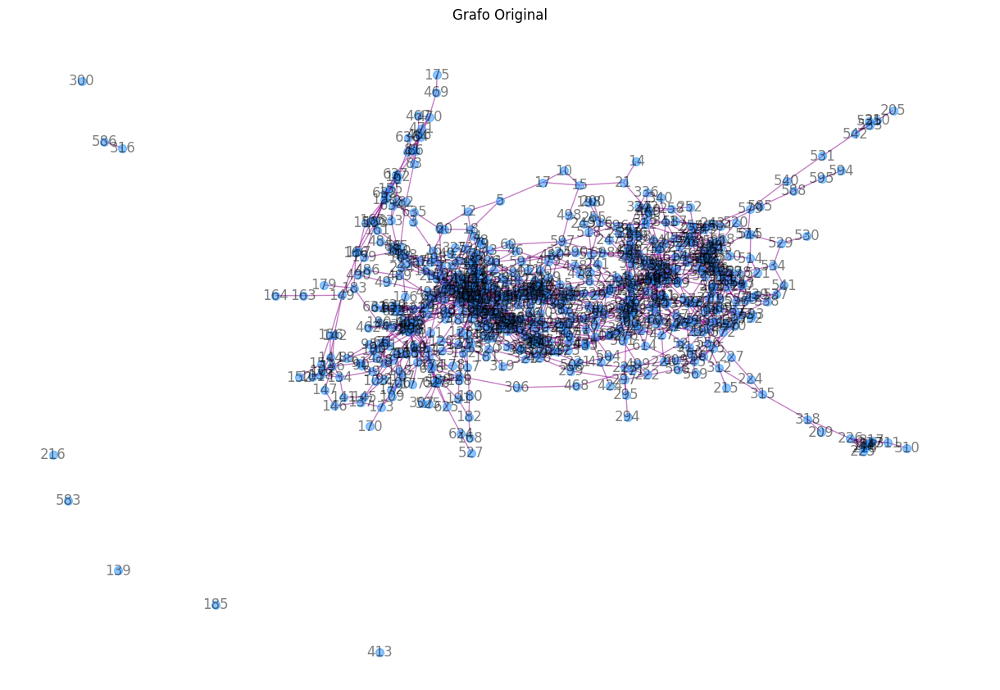

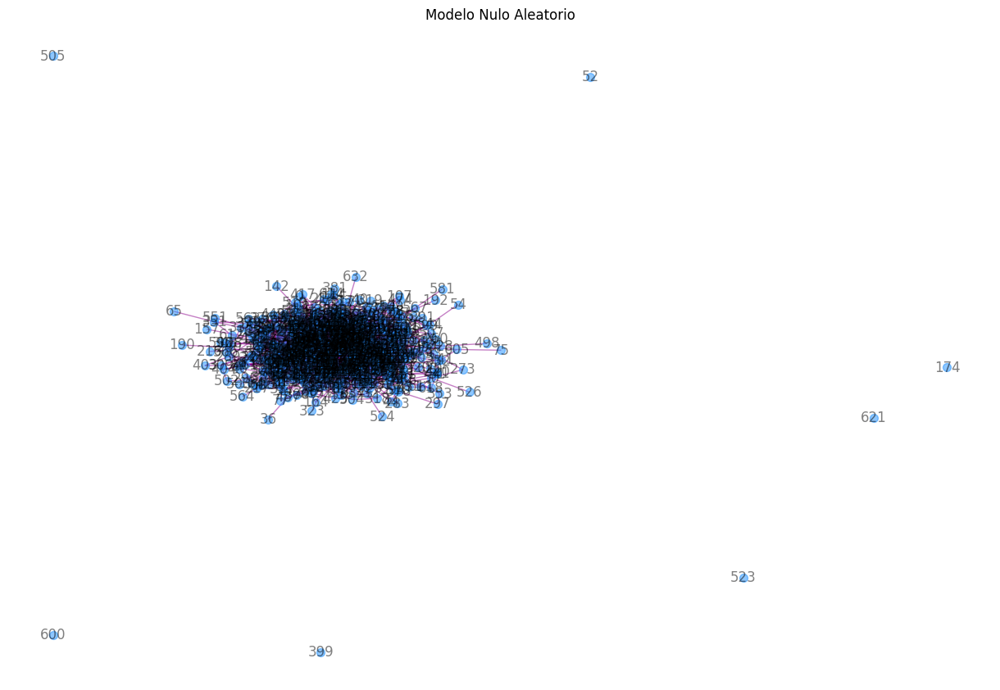

In [160]:
def propiedades_grafo(G):
    propiedades = {}

    # Grado medio
    avg_grad = sum(dict(G.degree()).values()) / G.number_of_nodes()
    propiedades['grado_medio'] = avg_grad

    # Coeficiente de agrupamiento (cluster)
    coef_cluster = nx.average_clustering(G)
    propiedades['coeficiente_de_agrupamiento'] = coef_cluster

    # Centralidad de cercanía (promedio)
    cercania = np.mean(list(nx.closeness_centrality(G).values()))
    propiedades['centralidad_cercania'] = cercania

    # Centralidad de intermediación (promedio)
    betweenness = nx.betweenness_centrality(G)
    intermediacion = np.mean(list(betweenness.values()))
    propiedades['centralidad_intermediacion'] = intermediacion

    return propiedades

def comparacion_propiedades(datos_originales, datos_modificados):
    print("\nComparación de propiedades:")
    for prop in datos_originales.keys():
        original = datos_originales[prop]
        modificado = datos_modificados[prop]
        cambio = ((modificado - original) / original) * 100 if original != 0 else "N/A"
        print(f"{prop.capitalize()}:")
        print(f"  Original: {original:.4f}")
        print(f"  Modificado: {modificado:.4f}")
        print(f"  Cambio: {cambio if cambio == 'N/A' else cambio:.2f}%\n")

# Grafo original
grafo_original = generate_graph(coactmat, 0.1, coordenadas)

# propiedades del grafo original
print("Calculando las propiedades del grafo original:")
datos_originales = propiedades_grafo(grafo_original)
print(datos_originales)

# MODELO NULO ALEATORIO
num_nodos = grafo_original.number_of_nodes()
num_aristas = grafo_original.number_of_edges()

# generamos el modelo nulo con el mismo número de aristas que el original
modelo_nulo = nx.gnm_random_graph(num_nodos, num_aristas)

# calculamos las propiedades del modelo aleatorio
print("Calculando las propiedades del modelo nulo aleatorio:")
datos_nulo = propiedades_grafo(modelo_nulo)
print(datos_nulo)

# Comparar las propiedades entre el grafo original y el modelo nulo
comparacion_propiedades(datos_originales, datos_nulo)

# Visualizar el grafo original y el modelo nulo aleatorio
def plot_grafo(G, titulo):
    pos = nx.spring_layout(G)  # Layout para visualizar en 2D
    plt.figure(figsize=(12, 8))
    nx.draw(G, pos, with_labels=True, node_color='dodgerblue', node_size=50, edge_color='darkmagenta', alpha=0.5)
    plt.title(titulo)
    plt.show()

# vamos a ver si salen los grafos !!
plot_grafo(grafo_original, "Grafo Original")
plot_grafo(modelo_nulo, "Modelo Nulo Aleatorio")

In [ ]:
# 9.
# Generar un modelo nulo aleatorio donde se conserve la distribución de grado y
# comparar sus propiedades con el grafo original del cerebro.

Calculando las propiedades del grafo original:
{'grado_medio': 4.529780564263323, 'coeficiente_de_agrupamiento': 0.24364464673564803, 'centralidad_cercania': np.float64(0.1194031264903796), 'centralidad_intermediacion': np.float64(0.01147712930871217)}
Calculamos las propiedades del modelo nulo aleatorio:
{'grado_medio': 4.5141065830721, 'coeficiente_de_agrupamiento': 0.009658051754216239, 'centralidad_cercania': np.float64(0.2299546907585896), 'centralidad_intermediacion': np.float64(0.005029043206383108)}
Comparamos propiedades:
Grado_medio:
  Original: 4.5298
  Modificado: 4.5141
  Cambio: -0.35%

Coeficiente_de_agrupamiento:
  Original: 0.2436
  Modificado: 0.0097
  Cambio: -96.04%

Centralidad_cercania:
  Original: 0.1194
  Modificado: 0.2300
  Cambio: 92.59%

Centralidad_intermediacion:
  Original: 0.0115
  Modificado: 0.0050
  Cambio: -56.18%



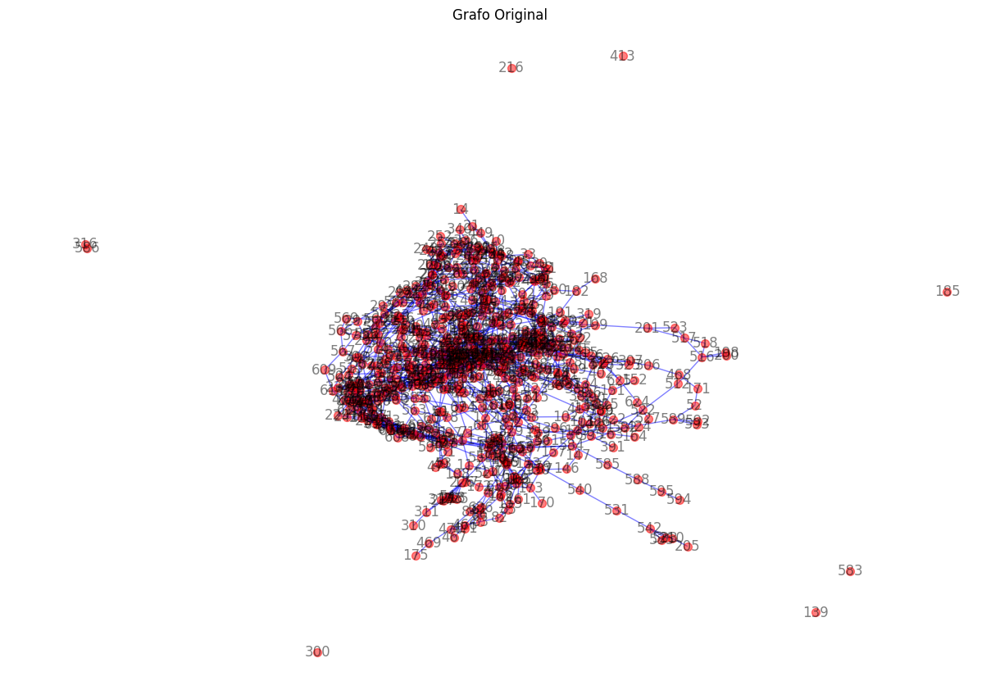

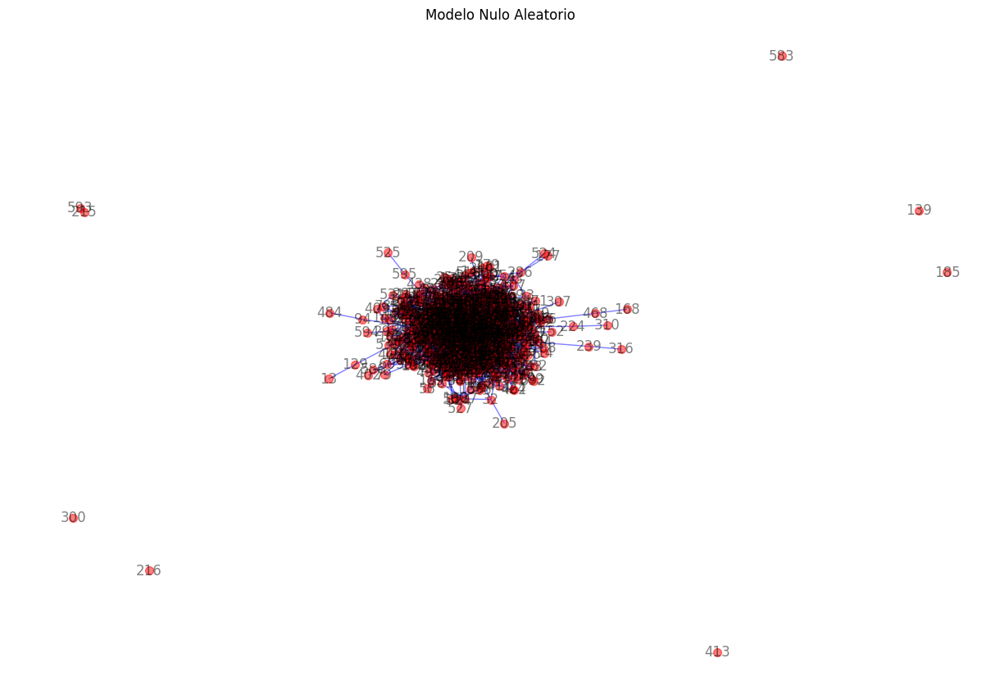

In [161]:
import networkx as nx
import numpy as np
import matplotlib.pyplot as plt

def propiedades_grafo(G):
    propiedades = {}

    # Grado medio
    avg_grad = sum(dict(G.degree()).values()) / G.number_of_nodes()
    propiedades['grado_medio'] = avg_grad

    # Coeficiente de cluster
    coef_cluster = nx.average_clustering(G)
    propiedades['coeficiente_de_agrupamiento'] = coef_cluster

    # Centralidad de cercanía
    cercania = np.mean(list(nx.closeness_centrality(G).values()))
    propiedades['centralidad_cercania'] = cercania

    # Centralidad de intermediación
    betweenness = nx.betweenness_centrality(G)
    intermediacion = np.mean(list(betweenness.values()))
    propiedades['centralidad_intermediacion'] = intermediacion

    return propiedades

def comparacion_propiedades(datos_originales, datos_modificados):

    print("Comparamos propiedades:")
    for prop in datos_originales.keys():
        original = datos_originales[prop]
        modificado = datos_modificados[prop]
        cambio = ((modificado - original) / original) * 100 if original != 0 else "N/A"
        print(f"{prop.capitalize()}:")
        print(f"  Original: {original:.4f}")
        print(f"  Modificado: {modificado:.4f}")
        print(f"  Cambio: {cambio if cambio == 'N/A' else cambio:.2f}%\n")

# Grafo original (usamos el grafo previamente generado)
grafo_original = generate_graph(coactmat, 0.1, coordenadas)

# Calcular las propiedades del grafo original
print("Calculando las propiedades del grafo original:")
datos_originales = propiedades_grafo(grafo_original)
print(datos_originales)

# MODELO NULO ALEATORIO con la misma distribución de grados
modelo_nulo = nx.configuration_model([grafo_original.degree(n) for n in grafo_original.nodes()])

# Convertir el modelo nulo en un grafo simple 
modelo_nulo_multigrafo = nx.configuration_model([grafo_original.degree(n) for n in grafo_original.nodes()])

#eliminar self-loops
modelo_nulo_multigrafo.remove_edges_from(nx.selfloop_edges(modelo_nulo_multigrafo))

# convertimos el modelo nulo en un grafo simple
modelo_nulo = nx.Graph(modelo_nulo_multigrafo)

# Calculamos las propiedades del modelo nulo aleatorio
print("Calculamos las propiedades del modelo nulo aleatorio:")
datos_nulo = propiedades_grafo(modelo_nulo)
print(datos_nulo)

# Comparar las propiedades entre el grafo original y el modelo nulo
comparacion_propiedades(datos_originales, datos_nulo)

# Visualizar el grafo original y el modelo nulo aleatorio
def plot_grafo(G, titulo):
    pos = nx.spring_layout(G) 
    plt.figure(figsize=(12, 8))
    nx.draw(G, pos, with_labels=True, node_color='red', node_size=50, edge_color='blue', alpha=0.5)
    plt.title(titulo)
    plt.show()

# Graficar el grafo original y el modelo nulo
plot_grafo(grafo_original, "Grafo Original")
plot_grafo(modelo_nulo, "Modelo Nulo Aleatorio")

In [ ]:
# 10.
#  Generar un modelo nulo utilizando una probabilidad de conexión en función de la
# distancia geométrica, con el mismo número de nodos y conexiones y compara sus
# propiedades y discutir la importancia de las conexiones 
# a larga distancia en el cerebro.

Calculando las propiedades del grafo original:
{'grado_medio': 4.529780564263323, 'coeficiente_de_agrupamiento': 0.24364464673564803, 'centralidad_cercania': np.float64(0.1194031264903796), 'centralidad_intermediacion': np.float64(0.01147712930871217)}
Calculamos las propiedades del modelo nulo con probabilidad geométrica:
{'grado_medio': 4.529780564263323, 'coeficiente_de_agrupamiento': 0.05488336115295363, 'centralidad_cercania': np.float64(0.1927184775258024), 'centralidad_intermediacion': np.float64(0.006522120566176706)}
Comparando de propiedades:
Grado_medio:
  Original: 4.5298
  Modificado: 4.5298
  Cambio: 0.00%

Coeficiente_de_agrupamiento:
  Original: 0.2436
  Modificado: 0.0549
  Cambio: -77.47%

Centralidad_cercania:
  Original: 0.1194
  Modificado: 0.1927
  Cambio: 61.40%

Centralidad_intermediacion:
  Original: 0.0115
  Modificado: 0.0065
  Cambio: -43.17%



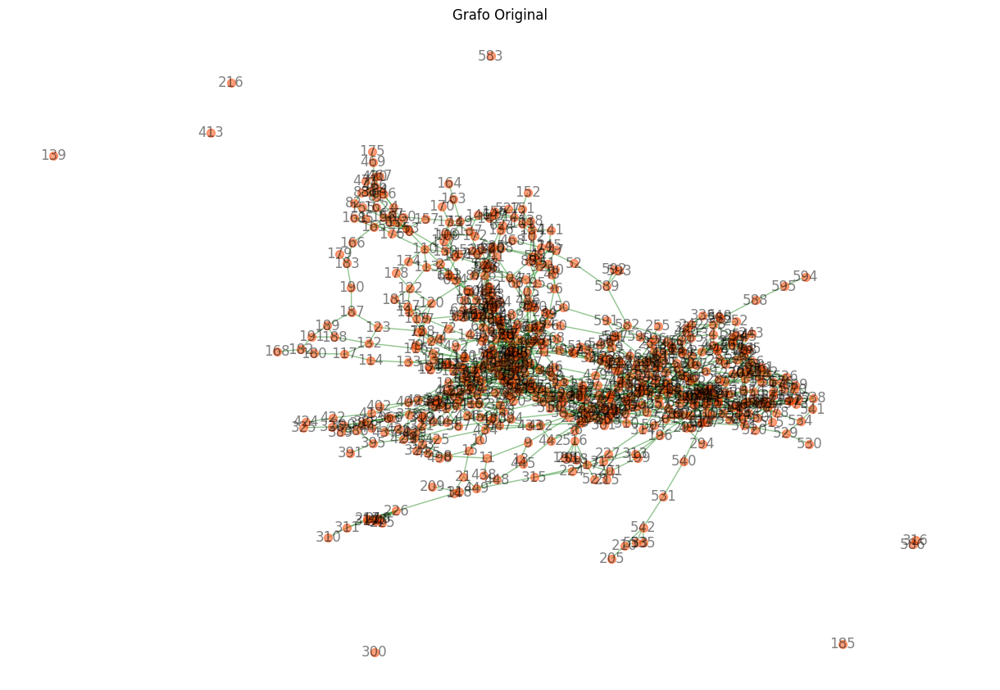

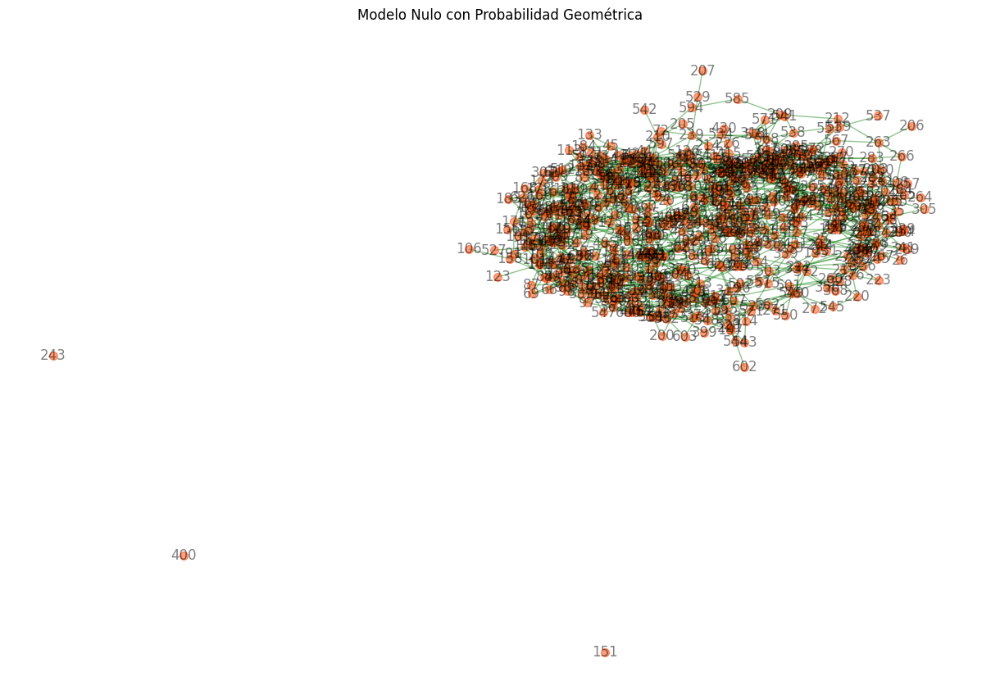

In [162]:
import networkx as nx
import numpy as np
import matplotlib.pyplot as plt

def propiedades_grafo(G):
    propiedades = {}

    # Grado medio
    avg_grad = sum(dict(G.degree()).values()) / G.number_of_nodes()
    propiedades['grado_medio'] = avg_grad

    # Coeficiente de cluster
    coef_cluster = nx.average_clustering(G)
    propiedades['coeficiente_de_agrupamiento'] = coef_cluster

    # Centralidad de cercanía
    cercania = np.mean(list(nx.closeness_centrality(G).values()))
    propiedades['centralidad_cercania'] = cercania

    # Centralidad de intermediación
    betweenness = nx.betweenness_centrality(G)
    intermediacion = np.mean(list(betweenness.values()))
    propiedades['centralidad_intermediacion'] = intermediacion

    return propiedades

def comparacion_propiedades(datos_originales, datos_modificados):

    print("Comparando de propiedades:")
    for prop in datos_originales.keys():
        original = datos_originales[prop]
        modificado = datos_modificados[prop]
        cambio = ((modificado - original) / original) * 100 if original != 0 else "N/A"
        print(f"{prop.capitalize()}:")
        print(f"  Original: {original:.4f}")
        print(f"  Modificado: {modificado:.4f}")
        print(f"  Cambio: {cambio if cambio == 'N/A' else cambio:.2f}%\n")

# Grafo original
grafo_original = generate_graph(coactmat, 0.1, coordenadas)

# Calcular las propiedades del grafo original
print("Calculando las propiedades del grafo original:")
datos_originales = propiedades_grafo(grafo_original)
print(datos_originales)

# Obtener las coordenadas de los nodos
nodos = list(grafo_original.nodes())
pos = nx.get_node_attributes(grafo_original, 'pos')

# Crear una matriz de distancias entre nodos
distancias = np.zeros((len(nodos), len(nodos)))
for i in range(len(nodos)):
    for j in range(len(nodos)):
        if i != j:
            distancias[i, j] = np.linalg.norm(np.array(pos[i]) - np.array(pos[j]))

# Parámetro de decaimiento para la probabilidad de conexión
alpha = 0.1

# Crear una matriz de probabilidades basada en la distancia
probabilidades = np.exp(-alpha * distancias)

# MODELO NULO en probabilidades de conexión
num_aristas = grafo_original.number_of_edges()
modelo_nulo = nx.Graph()
modelo_nulo.add_nodes_from(nodos)

# Establecer conexiones aleatorias basadas en las probabilidades
aristas = []
while len(aristas) < num_aristas:
    i, j = np.random.choice(len(nodos), size=2, replace=False)
    if (i, j) not in aristas and (j, i) not in aristas:
        if np.random.rand() < probabilidades[i, j]:
            aristas.append((i, j))

modelo_nulo.add_edges_from(aristas)

# Calculamos las propiedades del modelo nulo
print("Calculamos las propiedades del modelo nulo con probabilidad geométrica:")
datos_nulo = propiedades_grafo(modelo_nulo)
print(datos_nulo)

# Comparar las propiedades entre el grafo original y el modelo nulo
comparacion_propiedades(datos_originales, datos_nulo)

# Visualizar el grafo original y el modelo nulo
def plot_grafo(G, titulo):
    pos = nx.spring_layout(G)  # Layout para visualizar en 2D
    plt.figure(figsize=(12, 8))
    nx.draw(G, pos, with_labels=True, node_color='orangered', node_size=50, edge_color='forestgreen', alpha=0.5)
    plt.title(titulo)
    plt.show()

# Graficar el grafo original y el modelo nulo
plot_grafo(grafo_original, "Grafo Original")
plot_grafo(modelo_nulo, "Modelo Nulo con Probabilidad Geométrica")

In [ ]:
# Reseña sobre lo aprendido en el curso

In [ ]:
# Creo que aprender herramientas tan importantes como los diferentes lenguajes de programación para poder ser usados en el 
# campo de las neurociencias me parece muy importante!!! Me costó mucho trabajo, no se me da tan fácil la programación, 
# si creo que es importante enseñar bien para meterse bien en el mundo de la programación, aún más sabiendo que es un requisito
# vital e importante para nuestra carrera. Me gustó poder aprender la teoría de grafos, me gustó que las matrices que hemos aprendido
# a calcular y a graficar en clase sean utilizadas para cosas tan importantes como la visualización de datos del conectoma humano.
# Espero poder mejorar mis habilidades de programación, es pesado, pero es muy satisfactorio ver que te salen los programas.
# Creo que es importante dar a conocer más lo que hacemos en neurociencias, muchas personas que conozco (que saben de programación y que
# utilizan grafos) no sabían que se podían hacer cosas así en jupyter y en matlab!! Tenemos un deber grande, es importante difundir la información,
# divulgar los conocimientos que generamos.

# NOTAS:

Buen uso de funciones, aplicación de métodos de networkx (demuestra investigación)

Áreas de mejora: puedes reciclar funciones, la misma que hiciste para el ejercicio 3, usarla en el ejercicio 5 y así para simplificar código

El cálculo de los hubs no fue correcto
El cálculo de los conjuntos de Rich club